In [1]:
import sys 
sys.path.append('/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu')
import argparse
import os
import random
from typing import List, Union, Optional, Dict, Tuple
import gc

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import numpy as np
import pandas as pd

import torch
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score

import wandb

from transformers import AutoProcessor, LlavaForConditionalGeneration, set_seed 
import src.probing_utils as utils

[2025-09-09 20:49:49,144] [INFO] [real_accelerator.py:239:get_accelerator] Setting ds_accelerator to cuda (auto detect)


/opt/anaconda3/envs/py3_9/compiler_compat/ld: warning: libstdc++.so.6, needed by /usr/local/cuda/lib64/libcufile.so, not found (try using -rpath or -rpath-link)
/opt/anaconda3/envs/py3_9/compiler_compat/ld: warning: libm.so.6, needed by /usr/local/cuda/lib64/libcufile.so, not found (try using -rpath or -rpath-link)
/opt/anaconda3/envs/py3_9/compiler_compat/ld: /usr/local/cuda/lib64/libcufile.so: undefined reference to `std::runtime_error::~runtime_error()@GLIBCXX_3.4'
/opt/anaconda3/envs/py3_9/compiler_compat/ld: /usr/local/cuda/lib64/libcufile.so: undefined reference to `__gxx_personality_v0@CXXABI_1.3'
/opt/anaconda3/envs/py3_9/compiler_compat/ld: /usr/local/cuda/lib64/libcufile.so: undefined reference to `std::ostream::tellp()@GLIBCXX_3.4'
/opt/anaconda3/envs/py3_9/compiler_compat/ld: /usr/local/cuda/lib64/libcufile.so: undefined reference to `std::string::substr(unsigned long, unsigned long) const@GLIBCXX_3.4'
/opt/anaconda3/envs/py3_9/compiler_compat/ld: /usr/local/cuda/lib64/libc

In [2]:
df = pd.read_csv('/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/data/preprocess/llava-1.5-7b-hf-vizwiz_val-llava_answers.csv')
required_cols = {"image_path", "question", "label"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"Missing required column(s) in CSV: {missing}")

train_df = pd.read_csv('/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/data/preprocess/llava-1.5-7b-hf-vizwiz_train-llava_answers.csv')


train_idx = list(range(len(train_df)))
valid_idx = list(range(len(df)))

In [3]:
tokens_to_probe: List[Union[str, int]] = [
       "last_question_text_token",
       "step_3","step_2","step_1",
        -3, -2, -1
    ]

In [4]:
def parse_subset_layers(arg_val: Optional[str], num_layers: int) -> List[int]:
    if not arg_val:
        return list(range(num_layers))
    raw = [s.strip() for s in arg_val.split(",") if s.strip() != ""]
    idxs: List[int] = []
    for s in raw:
        i = int(s)
        if i < 0:
            i = num_layers + i  # negative index from end
        if not (0 <= i < num_layers):
            raise ValueError(f"subset_layers index out of range after normalization: {i} (num_layers={num_layers})")
        idxs.append(i)
    # keep order but uniquify
    seen = set()
    ordered = []
    for i in idxs:
        if i not in seen:
            ordered.append(i)
            seen.add(i)
    return ordered

In [ ]:
import src.probing_utils as utils; model, processor, tokenizer = utils.load_llava('llava-hf/llava-1.5-7b-hf')

In [5]:
model, processor, tokenizer = utils.load_llava('llava-hf/llava-1.5-7b-hf')
num_layers = utils.get_num_layers_from_config(model)
subset_layers = parse_subset_layers(None, num_layers)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [6]:
probes: Dict[Tuple[str, int], SGDClassifier] = {}
initialized: Dict[Tuple[str, int], bool] = {}

In [7]:
def get_num_layers_from_config(model) -> int:
    cfg = getattr(model, "config", None)
    if hasattr(cfg, "text_config") and hasattr(cfg.text_config, "num_hidden_layers"):
        return int(cfg.text_config.num_hidden_layers)
    if hasattr(cfg, "num_hidden_layers"):
        return int(cfg.num_hidden_layers)
    raise ValueError("Cannot find num_hidden_layers in config.")

def get_image_token_id(model) -> Optional[int]:
    return getattr(getattr(model, "config", None), "image_token_index", None)

def tokkey(t):
    return str(t) if isinstance(t, int) else t

In [8]:
#collect_features_for_split 
device = next(model.parameters()).device
dtype = next(model.parameters()).dtype
num_layers = get_num_layers_from_config(model)
image_token_id = get_image_token_id(model)

neg_ks = sorted([k for k in tokens_to_probe if isinstance(k, int)])

token_keys = [tokkey(t) for t in tokens_to_probe]
features: Dict[str, Dict[int, List[np.ndarray]]] = {k: {l: [] for l in range(num_layers)} for k in token_keys}
labels: Dict[str, List[int]] = {k: [] for k in token_keys}

In [9]:
neg_ks, token_keys ,features.keys(),labels

([-3, -2, -1],
 ['last_question_text_token', 'step_3', 'step_2', 'step_1', '-3', '-2', '-1'],
 dict_keys(['last_question_text_token', 'step_3', 'step_2', 'step_1', '-3', '-2', '-1']),
 {'last_question_text_token': [],
  'step_3': [],
  'step_2': [],
  'step_1': [],
  '-3': [],
  '-2': [],
  '-1': []})

In [10]:
image_root = '/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/data/COCO/images/val2014'
def _img_path(p):
    if image_root is None:
        return p
    return os.path.join(image_root, p)

In [11]:
def build_prompt(tokenizer, question: str) -> str:
    # 메시지 안에 이미지 + 텍스트 구성
    content = [{"type": "image"}, {"type": "text", "text": question+'Answer in one word.'}]
    if hasattr(tokenizer, "apply_chat_template"):
        messages = [{"role": "user", "content": content}]
        try:
            prompt = tokenizer.apply_chat_template(
                messages,
                add_generation_prompt=True,
                tokenize=False
            )
            return prompt
        except Exception:
            pass
    # fallback: 단순 프롬프트
    return "<image>\n" + question.strip() + "\n"

In [12]:
records = df.to_dict(orient="records")

In [13]:
records[0].keys()

dict_keys(['image_path', 'question', 'gold_answer', 'model_answer', 'label'])

In [ ]:
import torch
import gc
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt

batch_size = 1

images = []
prompts = []
ys = []
outs = []

with torch.inference_mode():
    for item in tqdm(records[:100]):
        if item['label'] == 1:
            img = Image.open(_img_path(item["image_path"])).convert("RGB")
            images.append(img)

            prompt = build_prompt(tokenizer, str(item["question"]))
            prompts.append(prompt)
            ys.append(item["gold_answer"])

            vlm_input = processor(
                images=img,
                text=prompt,
                padding=True,
                return_tensors="pt"
            )

            input_ids = vlm_input["input_ids"].to(device, non_blocking=True)
            attention_mask = vlm_input["attention_mask"].to(device, non_blocking=True)
            pixel_values = vlm_input["pixel_values"].to(dtype=dtype, device=device, non_blocking=True)

            out = model.generate(
                input_ids=input_ids,
                attention_mask=attention_mask,
                pixel_values=pixel_values,
                output_hidden_states=True,
                return_dict_in_generate=True,
                output_attentions=True,
                use_cache=False
            )

            seq_cpu = out.sequences.detach().cpu()
            hs_cpu = [[h.detach().cpu() for h in hs] for hs in out.hidden_states]
            attn_cpu = [[h.detach().cpu() for h in hs] for hs in out.attentions]
            outs.append({"sequences": seq_cpu, "hidden_states": hs_cpu,"attentions":attn_cpu})

            del vlm_input, input_ids, attention_mask, pixel_values, out, seq_cpu, hs_cpu
            torch.cuda.empty_cache()
            gc.collect()


 35%|███▌      | 35/100 [00:55<01:42,  1.58s/it]


KeyboardInterrupt: 

: 

In [ ]:
outs.keys()

AttributeError: 'list' object has no attribute 'keys'

Q: USER: <image>
What the screen says? Thank you.Answer in one word. ASSISTANT:
Gold: windows 7
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

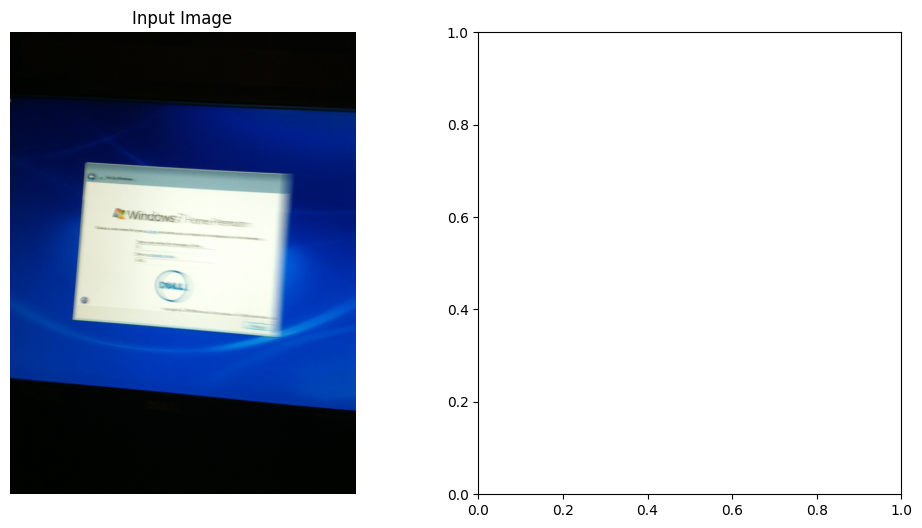

In [ ]:
import torch
import matplotlib.pyplot as plt

for i in range(len(images)):
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # 원본 이미지
    axs[0].imshow(images[i])
    axs[0].axis("off")
    axs[0].set_title("Input Image")

    # 질문/정답/모델 답
    q = prompts[i]
    gold = ys[i]
    model_ans = processor.decode(outs[i]['sequences'][0])
    print(f"Q: {q}\nGold: {gold}\nModel: {model_ans}")
    print(len(model_ans))

    # attention map 시각화
    attn_all = outs[i]["hidden_states"]  

    for step in attn_all:
        for layer_attn in step:
            print(layer_attn.shape)
            print(layer_attn)
            break
        break
    break
    # last_step_attn = attn_all[-1]    
    # last_layer_attn = last_step_attn[-1]  
    # attn_map = last_layer_attn[0, 0]  

    # # 예: image token index (pixel_values가 들어간 부분은 보통 text 앞에 붙음)
    # # 실제 인덱스는 processor/tokenizer 구조에 따라 달라요
    # image_token_idx = range(1, 65)   # 예시: 64개 image patch token
    # text_token_idx = range(65, attn_map.shape[-1])

    # img2txt_attn = attn_map[image_token_idx][:, text_token_idx].mean(0)

    # im = axs[1].imshow(img2txt_attn.unsqueeze(0), aspect="auto", cmap="viridis")
    # axs[1].set_title("Image → Text Attention (last layer, head 0)")
    # axs[1].set_xlabel("Text tokens")
    # axs[1].set_yticks([])
    # fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)

    # plt.show()


In [ ]:
attn_map

NameError: name 'attn_map' is not defined

Q: USER: <image>
What the screen says? Thank you.Answer in one word. ASSISTANT:
Gold: windows 7
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

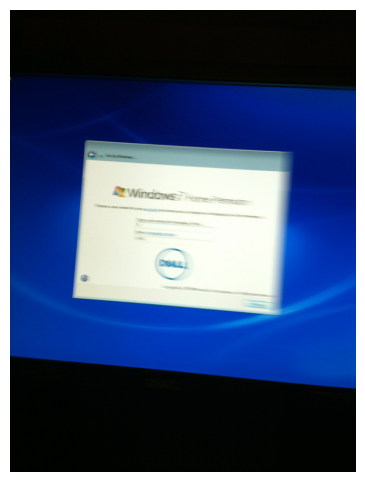

Q: USER: <image>
Can you describe for me what's going on outside the window? Just curious.Answer in one word. ASSISTANT:
Gold: nothing
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><

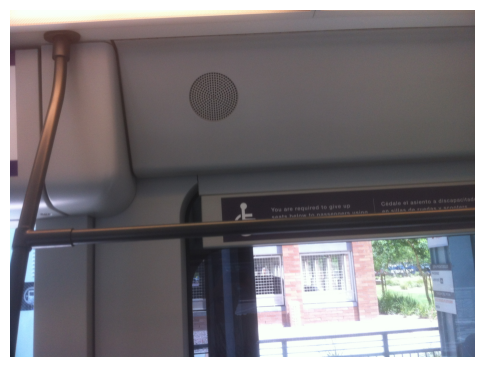

Q: USER: <image>
What is this?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

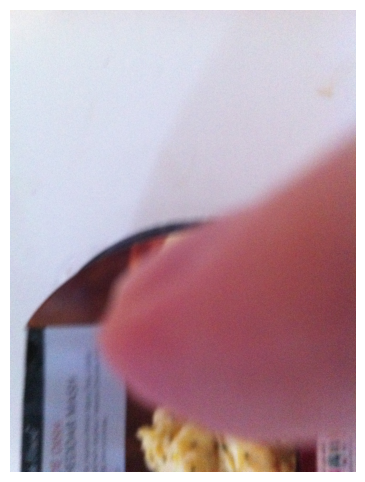

Q: USER: <image>
What is the computer doing?Answer in one word. ASSISTANT:
Gold: loading
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

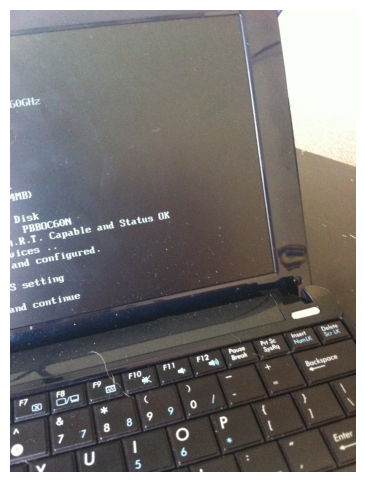

Q: USER: <image>
Can you tell what this is?Answer in one word. ASSISTANT:
Gold: dropper bottle
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

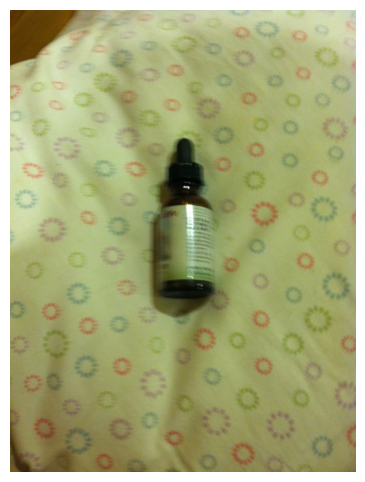

Q: USER: <image>
Can you tell me what the error message is on the Windows screen?Answer in one word. ASSISTANT:
Gold: starting windows
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><

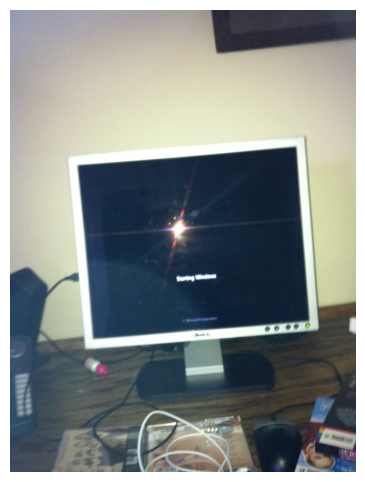

Q: USER: <image>
Sometimes it does this too.  It's great when it works, but when it doesn't, it's annoying.Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

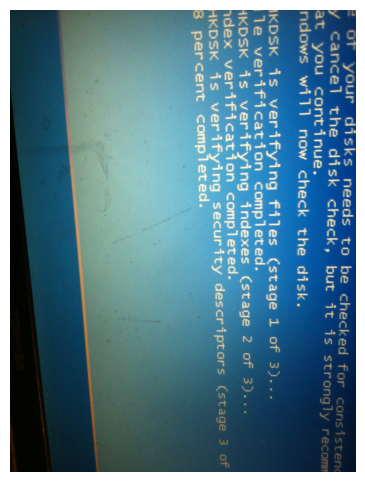

Q: USER: <image>
Can you tell me what these are please?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

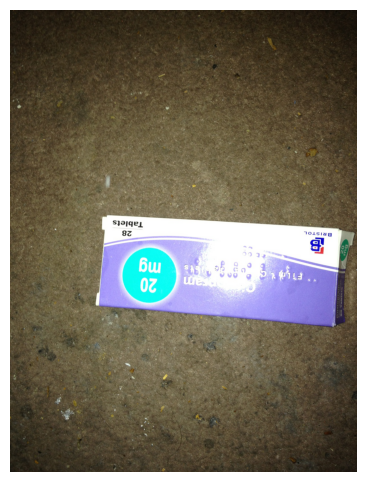

Q: USER: <image>
What does it say?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

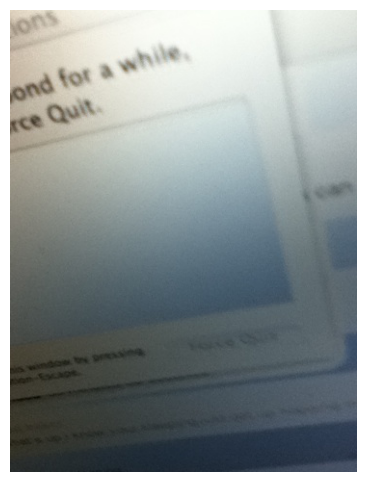

Q: USER: <image>
Can anyone tell me what's actually on the screen of the laptop?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

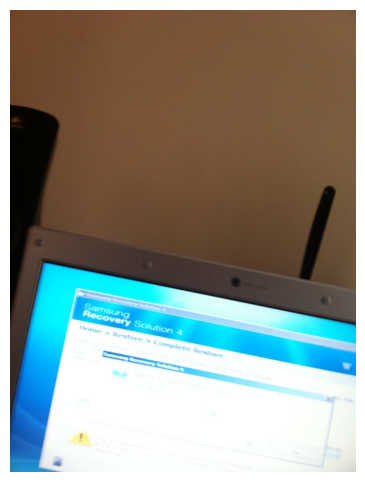

Q: USER: <image>
Can you tell me what this is a picture of?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

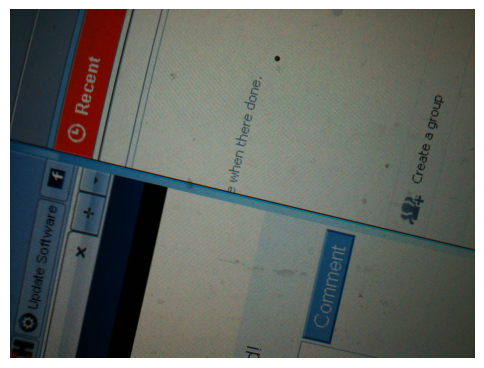

Q: USER: <image>
How big do you think my TV is? Thank you.Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

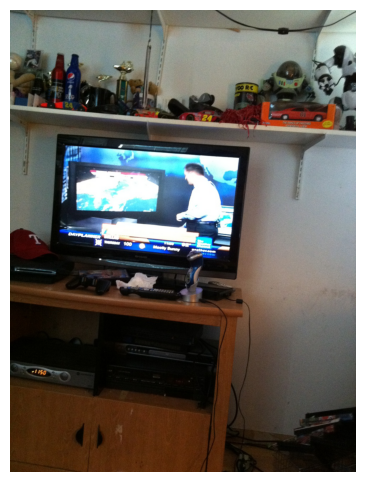

Q: USER: <image>
What is the expiration date on this bus pass?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

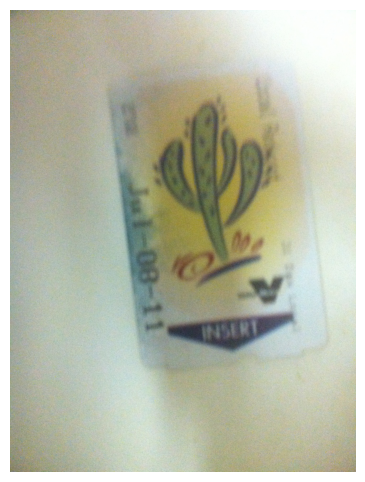

Q: USER: <image>
what is this we taking a picture of?Answer in one word. ASSISTANT:
Gold: boobs
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

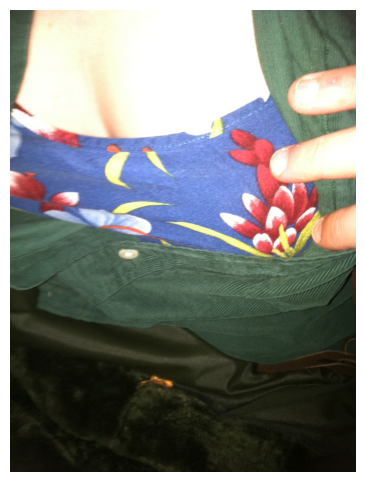

Q: USER: <image>
What kind of pop is this?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

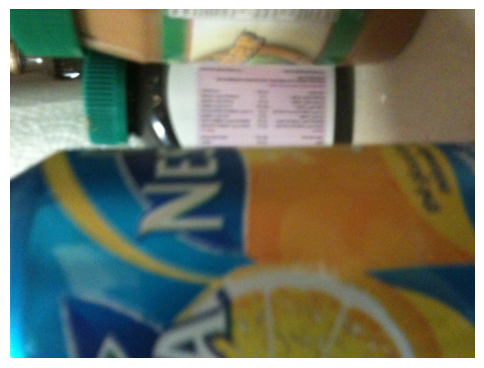

Q: USER: <image>
Where do you think I could get a power cord? Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

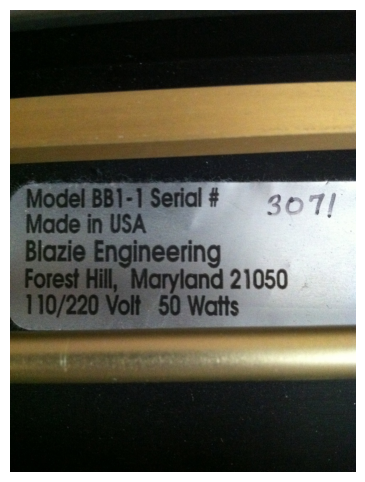

Q: USER: <image>
Please tell me the them of this bookAnswer in one word. ASSISTANT:
Gold: clive cussler dirk cussler
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

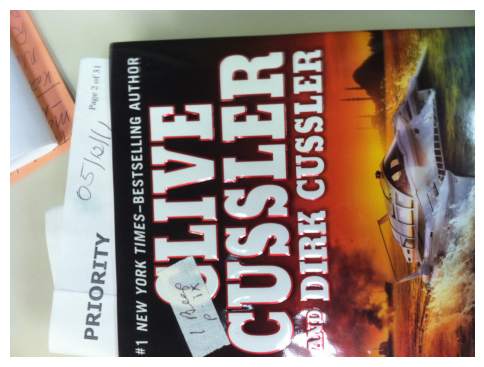

Q: USER: <image>
What is the person doing?Answer in one word. ASSISTANT:
Gold: looking at computer
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

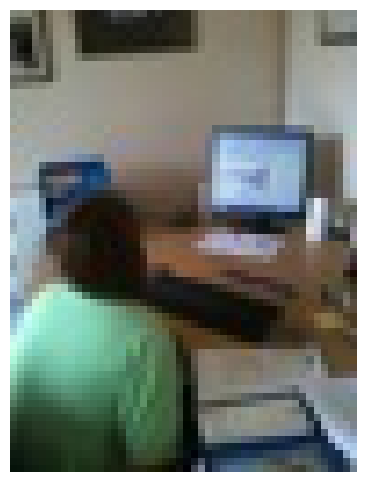

Q: USER: <image>
What does the screen say?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

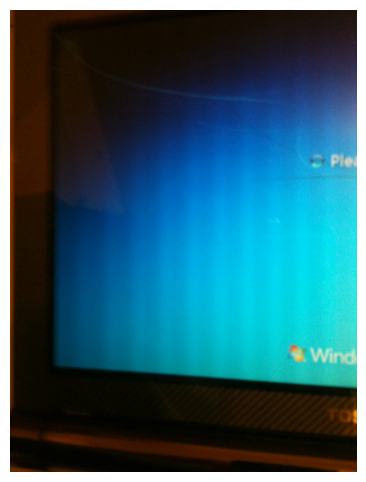

Q: USER: <image>
what does the sky look like in this photographAnswer in one word. ASSISTANT:
Gold: clear
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

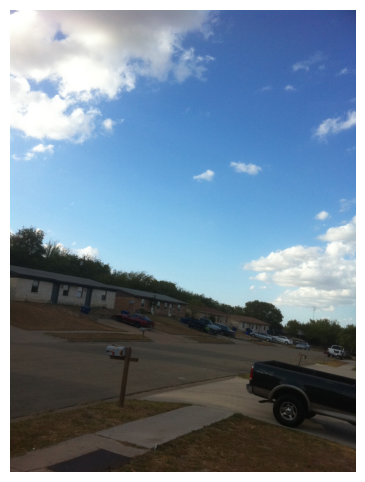

Q: USER: <image>
What's on my computer screen?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

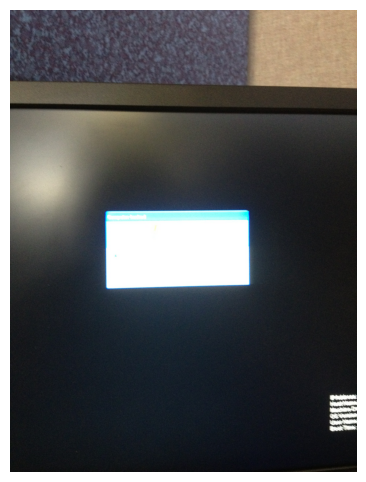

Q: USER: <image>
Can see what's on the screen, like is it a log in screen or anything like that? Thank you.Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

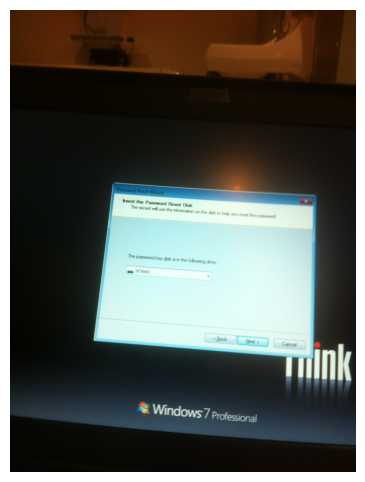

Q: USER: <image>
IS there a picture on this tv screen?Answer in one word. ASSISTANT:
Gold: yes
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

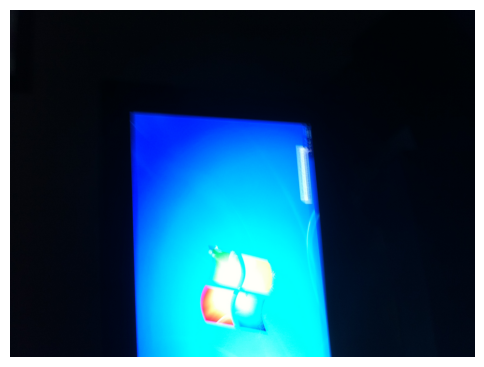

Q: USER: <image>
please explain what is on this piece of paperAnswer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

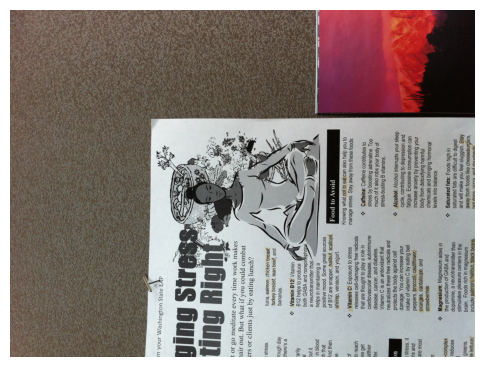

Q: USER: <image>
What does the screen say?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

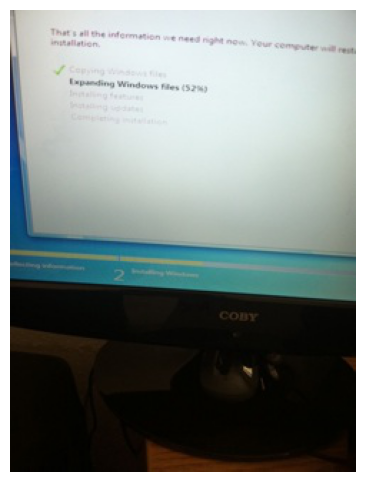

Q: USER: <image>
Is the dialogue more visible in that picture?Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

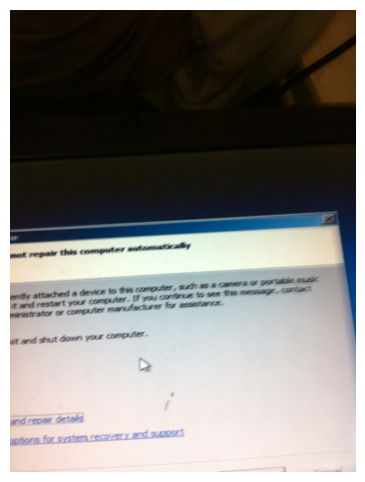

Q: USER: <image>
What does the small label on this disc say?Answer in one word. ASSISTANT:
Gold: prop quartics inc
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

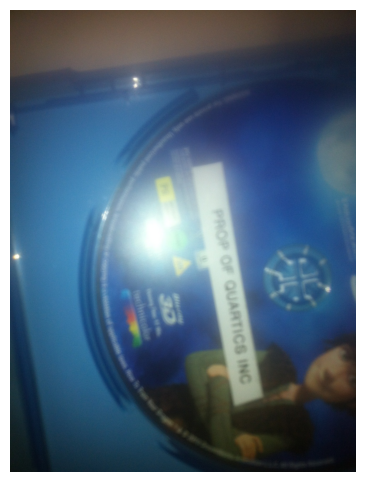

Q: USER: <image>
Is this picture clear, and where are we now?Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

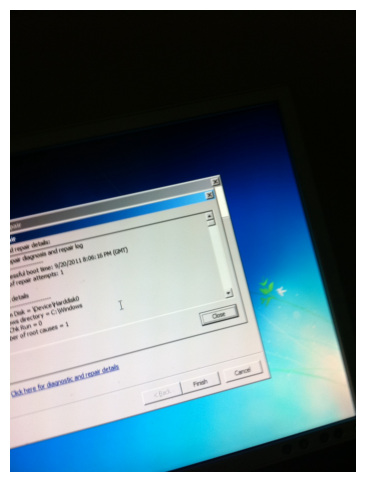

Q: USER: <image>
Can you see what's on the screen?Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><ima

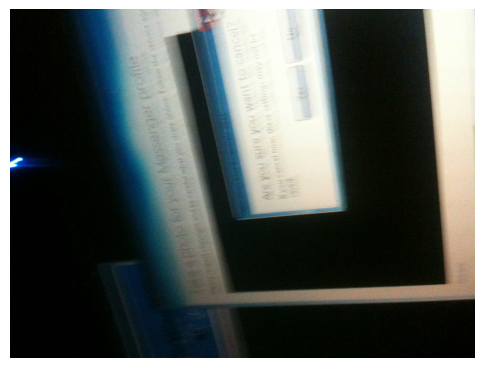

Q: USER: <image>
Alright. If you could tell what the screen says, that would be helpful, thank youAnswer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

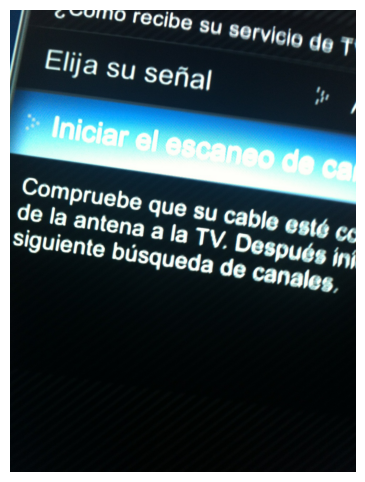

Q: USER: <image>
Can you see the dosage information? Thank you.Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

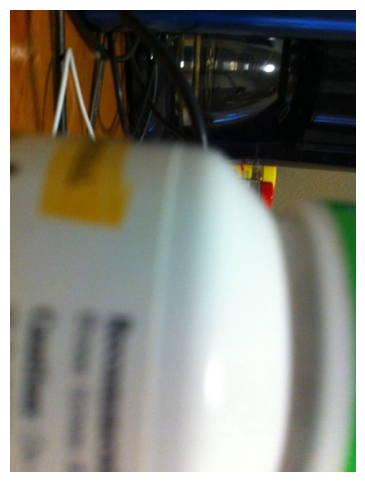

Q: USER: <image>
Is it impossible for you to read the captcha image in this picture? Thanks.Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><ima

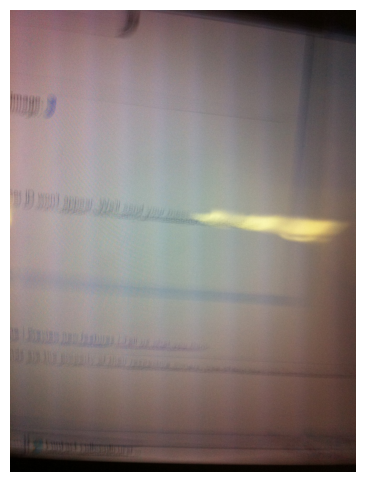

Q: USER: <image>
What is this?Answer in one word. ASSISTANT:
Gold: chest
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

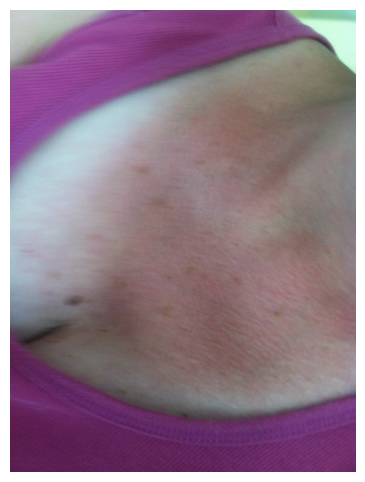

Q: USER: <image>
What is this item?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

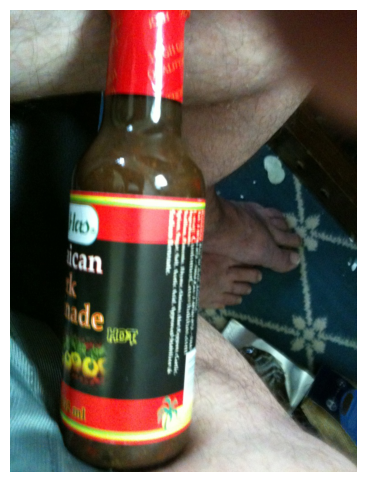

Q: USER: <image>
Yeah, it should be fine, I'm just trying to post it online so someone can see all the inputs and connectors and things like that. If you can see those, then yeah, email it to me at mike@melo.comAnswer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><

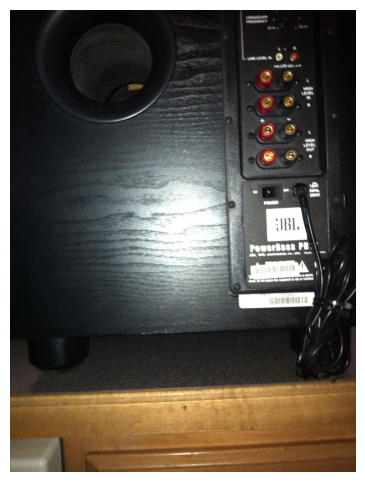

Q: USER: <image>
What drink is this?Answer in one word. ASSISTANT:
Gold: hint blackberry
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

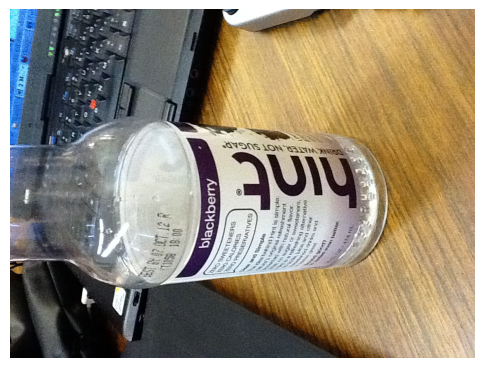

Q: USER: <image>
Can you tell me what this is a picture of?Answer in one word. ASSISTANT:
Gold: computer screen
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

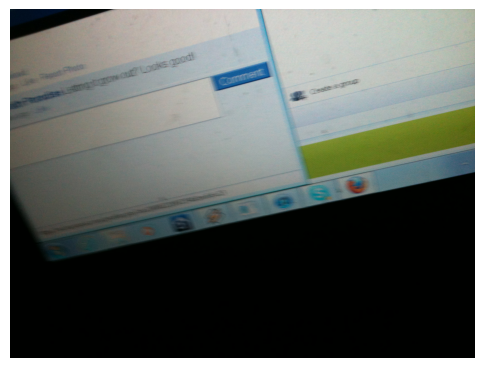

Q: USER: <image>
Can you see a bottle in this picture? And if so, what is it?Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

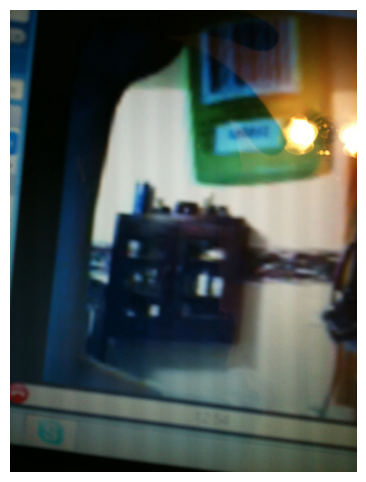

Q: USER: <image>
Can you tell us what this screen says? Thanks.Answer in one word. ASSISTANT:
Gold: next
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

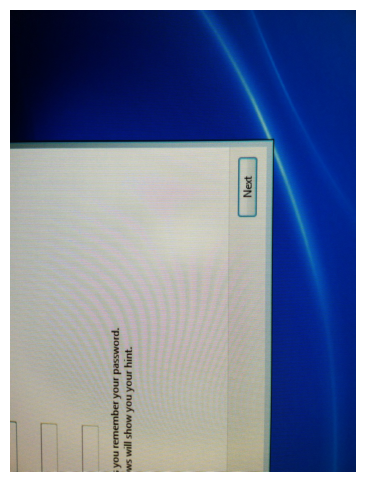

Q: USER: <image>
What is this?Answer in one word. ASSISTANT:
Gold: skype
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

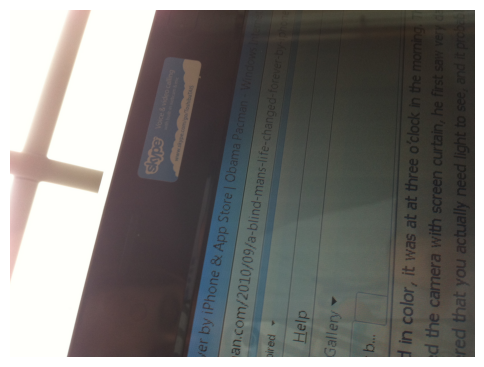

Q: USER: <image>
Can you please tell me what is displayed on the screen?Answer in one word. ASSISTANT:
Gold: startup repair
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

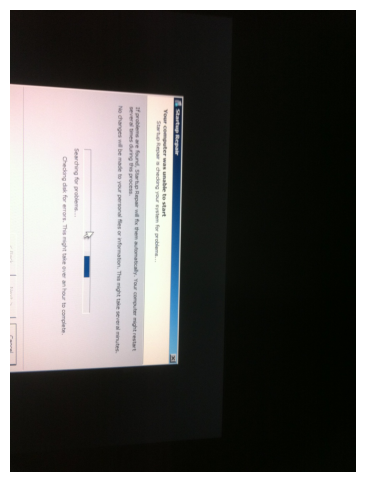

Q: USER: <image>
What is on this piece of paper?  Thank you.Answer in one word. ASSISTANT:
Gold: coupon
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><ima

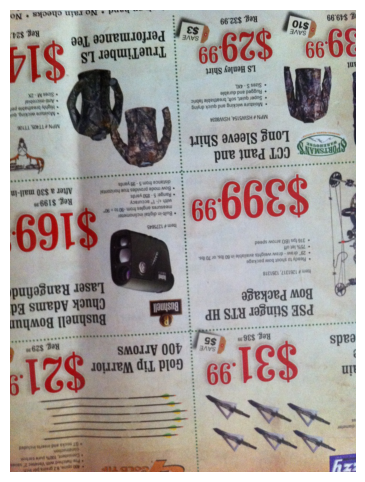

Q: USER: <image>
What does this say?What does this say?Answer in one word. ASSISTANT:
Gold: medicare inquiry center
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

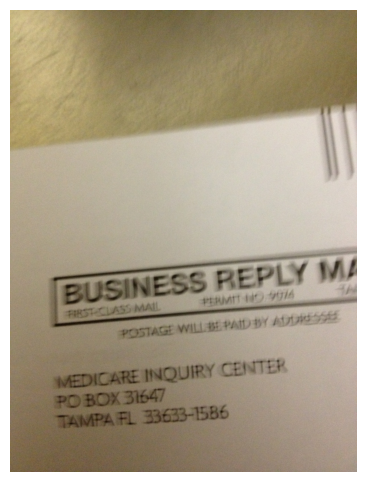

Q: USER: <image>
Can you please describe to me what's on the page and its orientation? Thank youAnswer in one word. ASSISTANT:
Gold: cars for sale
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

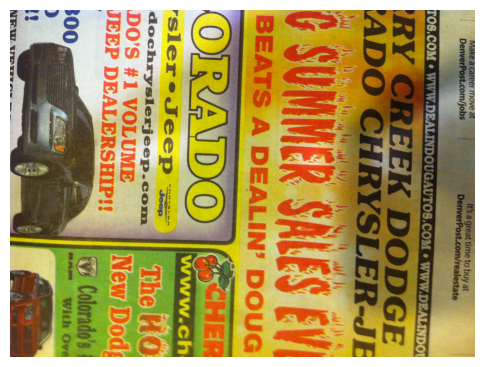

Q: USER: <image>
What does this say?  Thank you.Answer in one word. ASSISTANT:
Gold: your computer at risk
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><

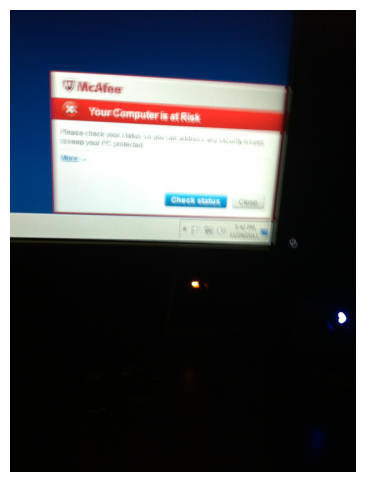

Q: USER: <image>
Can you tell what's on this paper?Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

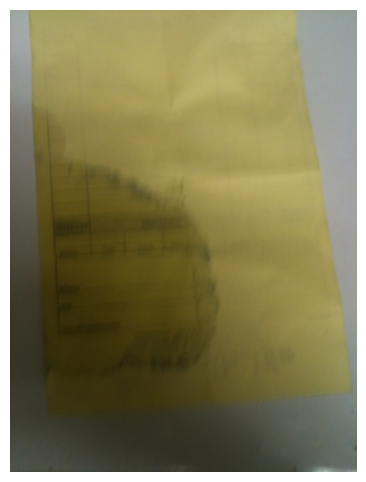

Q: USER: <image>
What is this?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

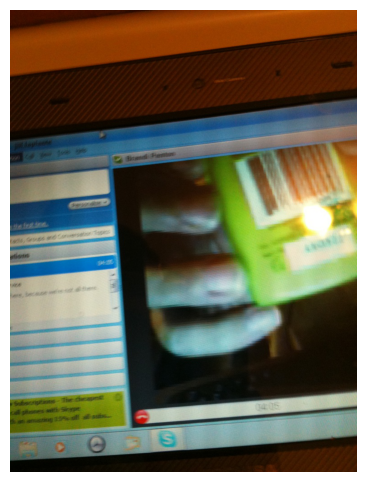

Q: USER: <image>
What does this coupon say on it?Answer in one word. ASSISTANT:
Gold: buy 1 pizza at menu price receive 1 pizza equal lesser value free expires 12 31 11
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

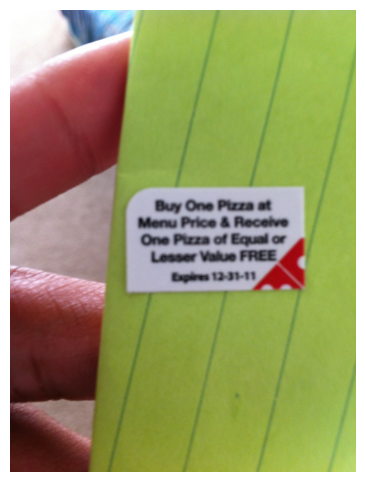

Q: USER: <image>
Can you tell what I'm playing?Answer in one word. ASSISTANT:
Gold: angry birds
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

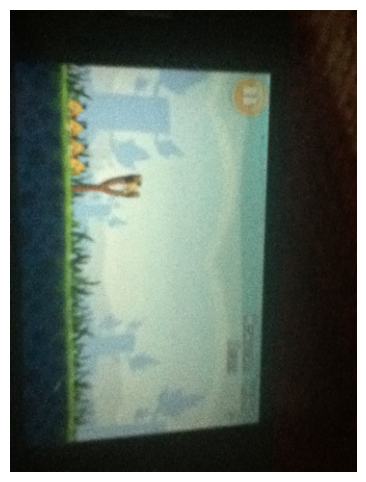

Q: USER: <image>
Yes, can you please tell me what this screen says? I seem to have an error booting up my computer. Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

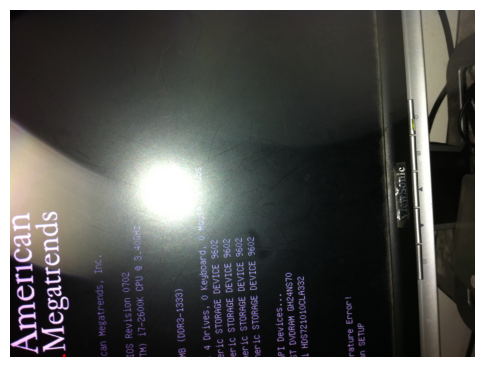

Q: USER: <image>
Help me with this capture.Answer in one word. ASSISTANT:
Gold: casithwo
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><imag

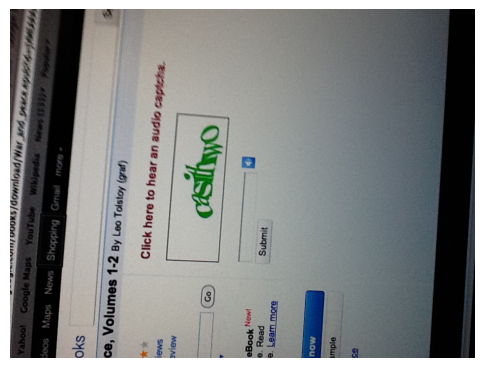

Q: USER: <image>
Can you give me an idea of what's on the screen? Thank you.Answer in one word. ASSISTANT:
Gold: menu
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><ima

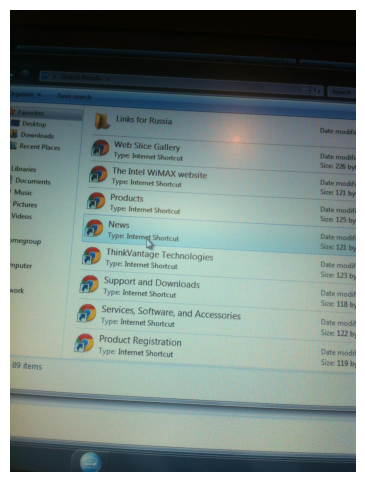

Q: USER: <image>
What does this say?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><

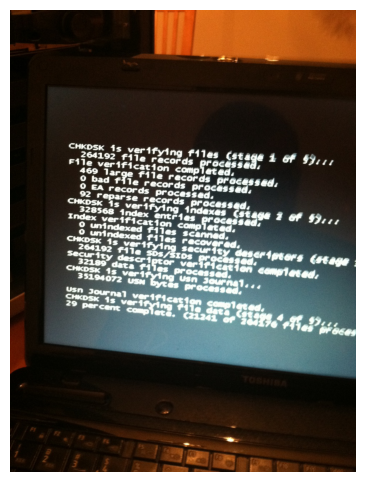

Q: USER: <image>
What is that word?Answer in one word. ASSISTANT:
Gold: entsursa
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

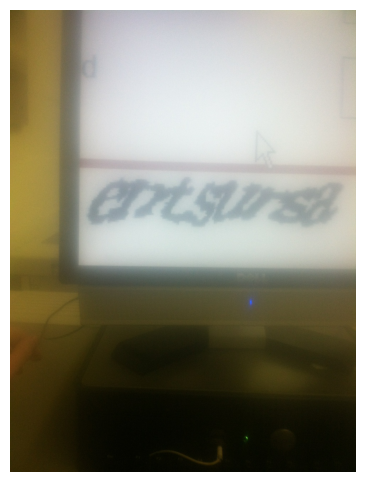

Q: USER: <image>
What does the top of this pamphlet say?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

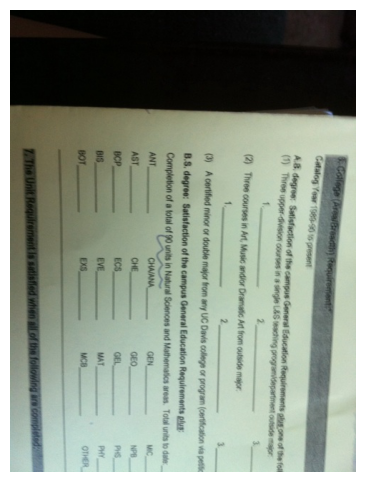

Q: USER: <image>
What is in this can?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

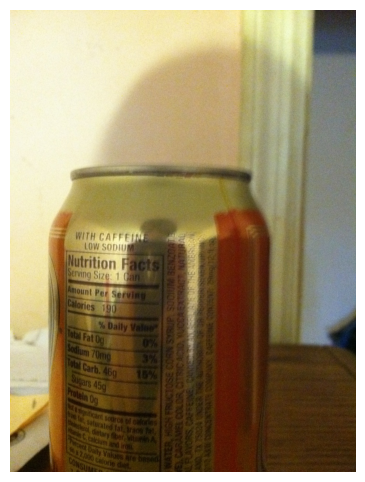

Q: USER: <image>
What's on this channel?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><ima

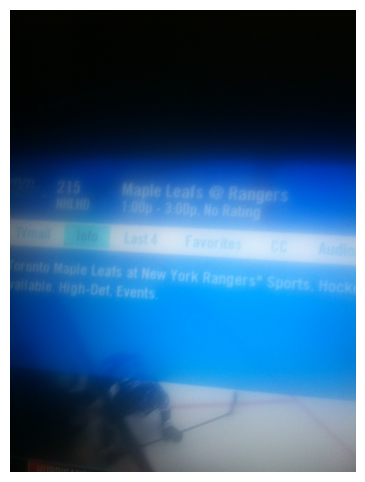

Q: USER: <image>
clouds in the sky look likeAnswer in one word. ASSISTANT:
Gold: white
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image>

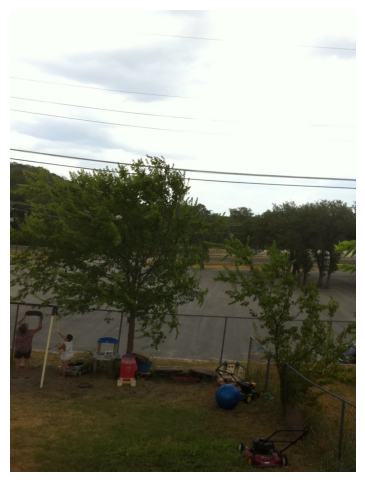

Q: USER: <image>
What does the screen say?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

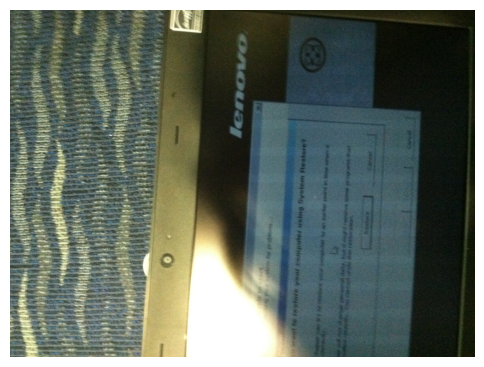

Q: USER: <image>
What does the text on this say?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

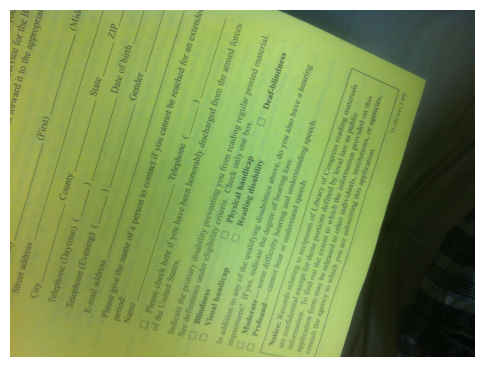

Q: USER: <image>
What's going on on the computer screen?Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><i

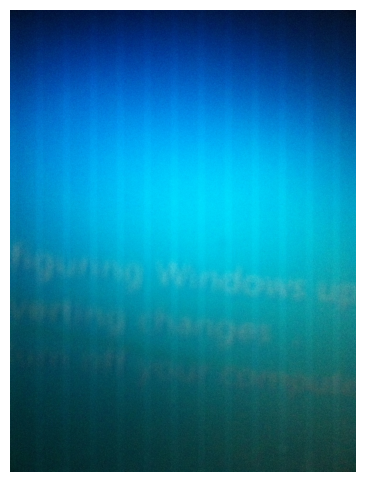

Q: USER: <image>
What does this cartoon look like? Thank you.Answer in one word. ASSISTANT:
Gold: unanswerable
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><ima

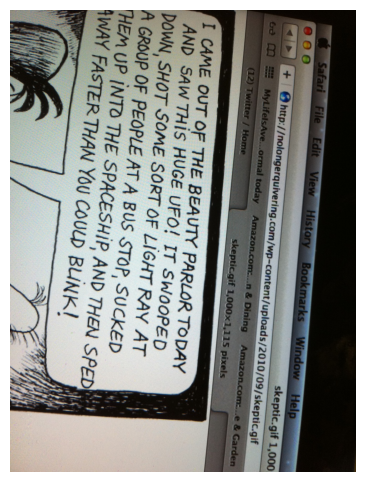

Q: USER: <image>
Is there text or any identifying identification on this side of the card?Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

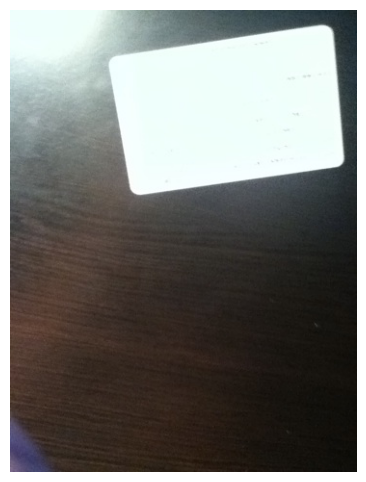

Q: USER: <image>
Is it more in focus now?Answer in one word. ASSISTANT:
Gold: no
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image

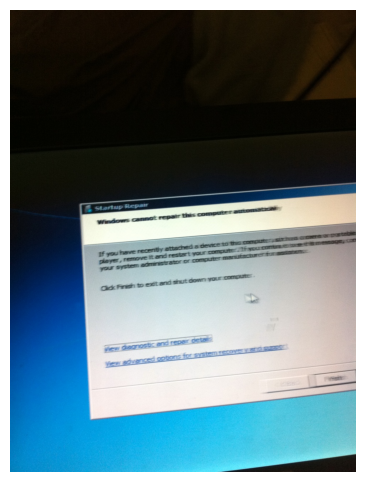

Q: USER: <image>
What is this CD?Answer in one word. ASSISTANT:
Gold: technet subscription
Model: <s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

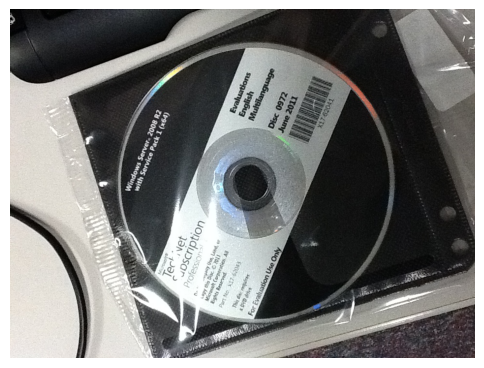

In [ ]:
import matplotlib.pyplot as plt

for i in range(len(images)):
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(images[i])
    ax.axis("off")
    
    q = prompts[i]
    gold = ys[i]
    model_ans = processor.decode(outs[i]['sequences'][0])
    
    print(f"Q: {q}\nGold: {gold}\nModel: {model_ans}")
    plt.show()


In [ ]:
outs[0].keys()

dict_keys(['sequences', 'hidden_states'])

USER: <image>
What the screen says? Thank you.Answer in one word. ASSISTANT:
<s> USER: <image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><image><im

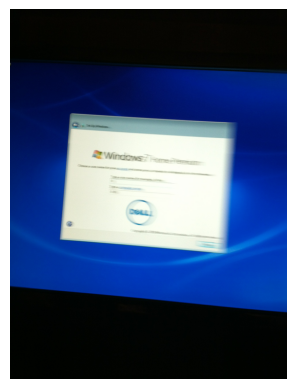

In [ ]:

plt.imshow(img)
print(prompt)
print(processor.decode(out[0][0]))
print(item['gold_answer'])
plt.axis("off")  # 축 눈금 제거
plt.show()


In [ ]:
for i in range(0,3):
    for layer in range(0,33):
        print(outs[0]['hidden_states'][i][layer].shape) #0~32 layer 수 

torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 601, 4096])
torch.Size([1, 602, 4096])
torch.Size([1, 602, 4096])
torch.Size([1, 602, 4096])
torch.Size([1, 602, 4096])
t

In [ ]:
hs = torch.stack(out.hidden_states[-1][1:], dim=0)  # [L, B, T, H]

In [ ]:
def nonpad_indices(attn_mask: torch.Tensor) -> torch.Tensor:
    # returns positions where attention_mask == 1
    return torch.nonzero(attn_mask, as_tuple=False).squeeze(-1)

def locate_positions_for_sample(
    input_ids: torch.Tensor,
    attention_mask: torch.Tensor,
    image_token_id: Optional[int],
    neg_ks: List[int],
) -> Dict[str, Optional[int]]:
    
    pos = {}
    idxs = nonpad_indices(attention_mask)
    if idxs.numel() == 0:
        # all pad? shouldn't happen
        for k in neg_ks:
            pos[str(k)] = None
        pos["last_question_text_token"] = None
        return pos

    # last/first non-pad
    first_idx = int(idxs[0].item())
    last_idx = int(idxs[-1].item())

    # negative offsets from end
    for k in neg_ks:  # e.g., -8..-1
        kk = abs(k)
        if kk <= idxs.numel():
            pos[str(k)] = int(idxs[-kk].item())
        else:
            pos[str(k)] = None


    pos["last_question_text_token"] = last_idx

    return pos


In [ ]:
per_step_lastlayer_lasttoken = torch.stack(
    [layer_hs_tuple[-1][:, -1, :]        
     for layer_hs_tuple in out.hidden_states],
    dim=0                                   # (steps, batch, hidden)
)

per_step_alllayers_lasttoken = torch.stack(
    [torch.stack([h[:, -1, :]            
                  for h in layer_hs_tuple[1:]],  
                 dim=0)                    # (layers, batch, hidden)
     for layer_hs_tuple in out.hidden_states],
    dim=0                                   # (steps, layers, batch, hidden)
).permute(0, 2, 1, 3)                        # (steps, batch, layers, hidden)

print(per_step_lastlayer_lasttoken.shape)     # torch.Size([steps, batch, hidden])
print(per_step_alllayers_lasttoken.shape)     # torch.Size([steps, batch, layers, hidden])

torch.Size([3, 3, 4096])
torch.Size([3, 3, 32, 4096])


In [ ]:
tokens_to_probe

['last_question_text_token', 'step_3', 'step_2', 'step_1', -3, -2, -1]

In [ ]:
tokkey('step_3') 

'step_3'

In [ ]:
B = input_ids.size(0)
for b in range(B):
    yb = ys[b]
    # import pdb;pdb.set_trace()
    pos_map = locate_positions_for_sample(
        input_ids[b], attention_mask[b],  image_token_id, neg_ks
    ) 
    # build a per-token valid mask & per-token position
    for t in tokens_to_probe:
        k = tokkey(t)                 
        p = pos_map.get(k, None)         
        # if p is None:
        #     continue  # skip this sample for this token
        # append label once per sample (per token)
        labels[k].append(yb)

        # for each layer, slice feature
        for l in range(num_layers):
            vec = hs[l, b, p, :].detach().float().cpu().numpy()  # (H,)
            features[k][l].append(vec)

        if "step" in k:
            step_num = int(k.split("_")[-1])   # e.g. "step_3" -> 3
            step_idx = step_num - 1            # 0-based index

            # 각 layer별 slice
            for l in range(num_layers):
                vec = (
                    per_step_alllayers_lasttoken[step_idx, b, l, :]  # (H,)
                    .detach()
                    .float()
                    .cpu()
                    .numpy()
                )
                features[k][l].append(vec)

In [ ]:
def safe_stack(feat_list: List[np.ndarray], dtype=np.float32) -> Optional[np.ndarray]:
    """Preallocate and copy row-by-row to avoid transient double-allocation."""
    if not feat_list:
        return None
    first = np.asarray(feat_list[0])
    out = np.empty((len(feat_list),) + first.shape, dtype=dtype)
    for i, a in enumerate(feat_list):
        ai = np.asarray(a)
        if ai.shape != first.shape:
            raise ValueError(f"Inconsistent feature shape at {i}: {ai.shape} vs {first.shape}")
        out[i] = ai.astype(dtype, copy=False)
    return out

In [ ]:
features.keys()

dict_keys(['last_question_text_token', 'step_3', 'step_2', 'step_1', '-3', '-2', '-1'])

In [ ]:
len(features['last_question_text_token'][0])

33

: 

In [ ]:
for tok in tokens_to_probe:
    key = tokkey(tok)
    y_list = labels.get(key, [])
    # import pdb;pdb.set_trace()
    # if len(y_list) == 0:
    #     continue
    y_arr = np.asarray(y_list, dtype=np.int32)

    for l in subset_layers:
        X_list = features.get(key, {}).get(l, [])
        if len(X_list) == 0:
            continue
        X_arr = safe_stack(X_list, dtype=np.float32)
        k = (key, l)
        if k not in probes:
            probes[k] = SGDClassifier(loss="log_loss", alpha=1e-4, learning_rate="constant", eta0=1e-2, max_iter=1, warm_start=True)
            initialized[k] = False
        
        if not initialized[k]:
            probes[k].partial_fit(X_arr, y_arr, classes=np.array([0, 1], dtype=np.int32))
            initialized[k] = True
        else:
            probes[k].partial_fit(X_arr, y_arr)

        
        del X_arr, X_list
    del y_arr, y_list

gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

y_true_map: Dict[Tuple[str, int], List[int]] = {}
y_score_map: Dict[Tuple[str, int], List[float]] = {}


ValueError: Inconsistent feature shape at 18: (1, 603, 4096) vs (4096,)

In [7]:
# --- 1) 핵심 연산 정의: λ-결합, 부분집합 측도, Sugeno 적분(과정 출력) ---

from typing import Dict, Iterable, List, Tuple

def combine_lambda(a: float, b: float, lmbda: float) -> float:
    """서로소 결합식: g(A∪B) = a + b + λab"""
    return a + b + lmbda * a * b

def lambda_measure(subset: Iterable[str],
                   singletons: Dict[str, float],
                   lmbda: float) -> float:
    """subset ⊆ U 에 대한 g(subset) 계산 (λ-결합으로 fold)"""
    g = 0.0
    for e in subset:
        g = combine_lambda(g, singletons[e], lmbda)
    return g

def sugeno_integral_verbose(values: Dict[str, float],
                            singletons: Dict[str, float],
                            lmbda: float) -> float:
    """
    Sugeno 적분의 진행을 한 줄씩 출력합니다.
    S = max_k min( f_(k), g(A_k) ),  f_(1) ≥ f_(2) ≥ ...
    """
    ordered: List[Tuple[str, float]] = sorted(values.items(),
                                              key=lambda kv: kv[1],
                                              reverse=True)
    print("[정렬된 f (내림차순)]", ordered, "\n")

    best = 0.0
    current: List[str] = []
    for k, (e, fval) in enumerate(ordered, start=1):
        current.append(e)
        g_Ak = lambda_measure(current, singletons, lmbda)
        step = min(fval, g_Ak)
        best = max(best, step)
        print(f"k={k}: A_{k}={current} | f_(k)={fval:.4f}  g(A_k)={g_Ak:.4f}  "
              f"min={step:.4f}  => 현재 최대={best:.4f}")
    print("\n[Sugeno integral] =", best)
    return best


# --- 2) 2원소 예시: 단일측도 -> λ 폐형식, 과정 확인 ---

# (1) 단일측도: 각 원소의 '중요도(측도)' = g({xi})
g_single = {"x1": 0.3, "x2": 0.2}

# (2) 2원소에서 λ는 폐형식:
#     λ = (1 - (v1 + v2)) / (v1 * v2)
v1, v2 = g_single["x1"], g_single["x2"]
lam = (1 - (v1 + v2)) / (v1 * v2)
print(f"[lambda] λ = {lam:.10f}")

# (3) 부분집합 측도 확인
g_x1 = g_single["x1"]
g_x2 = g_single["x2"]
g_union = combine_lambda(g_x1, g_x2, lam)
print(f"[measure] g({{'x1'}})={g_x1:.4f}, g({{'x2'}})={g_x2:.4f}, g({{'x1','x2'}})={g_union:.4f}\n")

# (4) f값: '실제 데이터/평가값'
fvals = {"x1": 0.7, "x2": 0.4}

# (5) Sugeno 적분 진행 출력
S = sugeno_integral_verbose(fvals, g_single, lam)


[lambda] λ = 8.3333333333
[measure] g({'x1'})=0.3000, g({'x2'})=0.2000, g({'x1','x2'})=1.0000

[정렬된 f (내림차순)] [('x1', 0.7), ('x2', 0.4)] 

k=1: A_1=['x1'] | f_(k)=0.7000  g(A_k)=0.3000  min=0.3000  => 현재 최대=0.3000
k=2: A_2=['x1', 'x2'] | f_(k)=0.4000  g(A_k)=1.0000  min=0.4000  => 현재 최대=0.4000

[Sugeno integral] = 0.4
